In [ ]:
# Common
import os
import keras
import numpy as np
from glob import glob
import tensorflow as tf

# Images
import cv2 as cv
from tensorflow.keras.preprocessing.image import img_to_array

# Visualization
import matplotlib.pyplot as plt

# Model
from keras import Sequential
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, Conv2DTranspose, Reshape, InputLayer, Flatten, Dense

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
source_image_path = '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/'
target_image_path = '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/'

# Get Images
source_image_names = sorted(glob(source_image_path + "*.png"))
target_image_names = sorted(glob(target_image_path + "*.png"))

In [ ]:
source_image_names[:10]

['/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_0.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_1.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_10.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_100.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_101.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_102.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_103.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_104.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_105.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/source/0_106.png']

In [ ]:
target_image_names[:10]

['/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_0.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_1.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_10.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_100.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_101.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_102.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_103.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_104.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_105.png',
 '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/target/0_106.png']

 Used Mulitprocessing for images preprocessing, as it took more almost an hour for this piece of code to run, which got shorter to almost 20 minutes

In [ ]:
import cv2 as cv
import numpy as np
from tensorflow.keras.preprocessing.image import img_to_array
from multiprocessing import Pool

SIZE = 120
btch_size = 16

def preprocess_image(img_path):
    img = cv.imread(img_path)
    img = cv.resize(img, (SIZE, SIZE), cv.INTER_CUBIC)
    img = img_to_array(img)
    img = img.astype('float') / 255.
    return img

def process_batch(batch_paths):
    batch_images = []
    for img_path in batch_paths:
        img = preprocess_image(img_path)
        batch_images.append(img)
    return batch_images

source_images = []
target_images = []

# Create batches of image paths
source_image_batches = [source_image_names[i:i+btch_size] for i in range(0, len(source_image_names), btch_size)]
target_image_batches = [target_image_names[i:i+btch_size] for i in range(0, len(target_image_names), btch_size)]

# Process batches in parallel
with Pool() as pool:
    source_results = pool.map(process_batch, source_image_batches)
    target_results = pool.map(process_batch, target_image_batches)

# Flatten the results
source_images = np.array([img for batch in source_results for img in batch])
target_images = np.array([img for batch in target_results for img in batch])

In [ ]:
image_shape = source_images.shape[-3:]
image_shape

(120, 120, 3)

In [ ]:
from keras.models import Model
from keras.layers import Input, Dense, Reshape, Conv2D, Conv2DTranspose, Flatten, GlobalAveragePooling2D

# Generator model
gen_input = Input(shape=image_shape)
gen_conv1 = Conv2DTranspose(64, kernel_size=3, strides=2, padding='valid', activation='relu')(gen_input)
gen_conv2 = Conv2DTranspose(32, kernel_size=3, strides=2, padding='same', activation='relu')(gen_conv1)
gen_conv3 = Conv2DTranspose(16, kernel_size=3, strides=2, padding='same', activation='relu')(gen_conv2)
gen_output = Conv2DTranspose(3, kernel_size=3, strides=2, padding='same', activation='sigmoid')(gen_conv3)
generator = Model(gen_input, gen_output)

# Discriminator model
disc_input = Input(shape=image_shape)
disc_conv1 = Conv2D(16, kernel_size=3, strides=2, padding='same', activation='relu')(disc_input)
disc_conv2 = Conv2D(32, kernel_size=3, strides=2, padding='same', activation='relu')(disc_conv1)
disc_conv3 = Conv2D(64, kernel_size=3, strides=2, padding='same', activation='relu')(disc_conv2)
disc_pool = GlobalAveragePooling2D()(disc_conv3)
disc_output = Dense(1, activation='sigmoid')(disc_pool)
discriminator = Model(disc_input, disc_output)

# Compile discriminator
discriminator.compile(loss='binary_crossentropy',
                      optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                      metrics=['accuracy'])

# Combine generator and discriminator
gan_input = Input(shape=image_shape)  # Use image_shape instead of (100,)
generated_image = generator(gan_input)
generated_image_resized = tf.image.resize(generated_image, (SIZE, SIZE))
gan_output = discriminator(generated_image_resized)
gan = Model(gan_input, gan_output)

# Compile GAN
gan.compile(loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))

In [ ]:
# Initialize lists for losses
discriminator_losses = []
generator_losses = []

# Training loop
def train_gan(gan, generator, discriminator, source_images, target_images, epochs, batch_size):
    # Create labels for real and fake images
    real_labels = np.ones((batch_size, 1))
    fake_labels = np.zeros((batch_size, 1))

    for epoch in range(epochs):
        for _ in range(batch_size):
            # Select random real images from source_images
            idx = np.random.randint(0, source_images.shape[0], batch_size)
            real_images = source_images[idx]

            # Select random target images
            target_batch_idx = np.random.randint(0, target_images.shape[0], batch_size)
            target_images_batch = target_images[target_batch_idx]

            # Train the discriminator on real and fake images
            discriminator_loss_real = discriminator.train_on_batch(real_images, real_labels)
            generated_images = generator.predict(target_images_batch)  # Generate images from target images
            discriminator_loss_fake = discriminator.train_on_batch(generated_images, fake_labels)
            discriminator_loss = 0.5 * np.add(discriminator_loss_real, discriminator_loss_fake)

            # Train the generator to fool the discriminator
            generator_loss = gan.train_on_batch(target_images_batch, real_labels)  # Use target images as input

        # Append the losses to the lists
        discriminator_losses.append(discriminator_loss[0])
        generator_losses.append(generator_loss)

        # Print the losses for each epoch
        print(f"Epoch {epoch + 1}/{epochs}, Discriminator Loss: {discriminator_loss[0]}, Generator Loss: {generator_loss}")

        # Visualize generated images
        if (epoch + 1) % 1 == 0:
            visualize_images(generator, target_images_batch)

 Generator here takes random noise as the input, which should be changed to target images(target_images), which i am having trouble with, due to image shape mismatch between discriminator and generator.

In [ ]:
# Updated visualization function to display target images along with generated images
def visualize_images(generator, target_images, num_images=4, img_size=SIZE):
    generated_images = generator.predict(target_images)

    plt.figure(figsize=(8, 8))
    for i in range(num_images):
        plt.subplot(3, 2, i+1)
        plt.imshow(target_images[i])
        plt.title("Target Image")
        plt.axis('off')

        plt.subplot(3, 2, i+2)
        plt.imshow(generated_images[i])
        plt.title("Generated Image")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 20ms/step
Epoch 1/50, Discriminator Loss: 0.6960821151733398, Generator Loss: 0.675224781036377
1/1 [==============================] - 0s 19ms/step


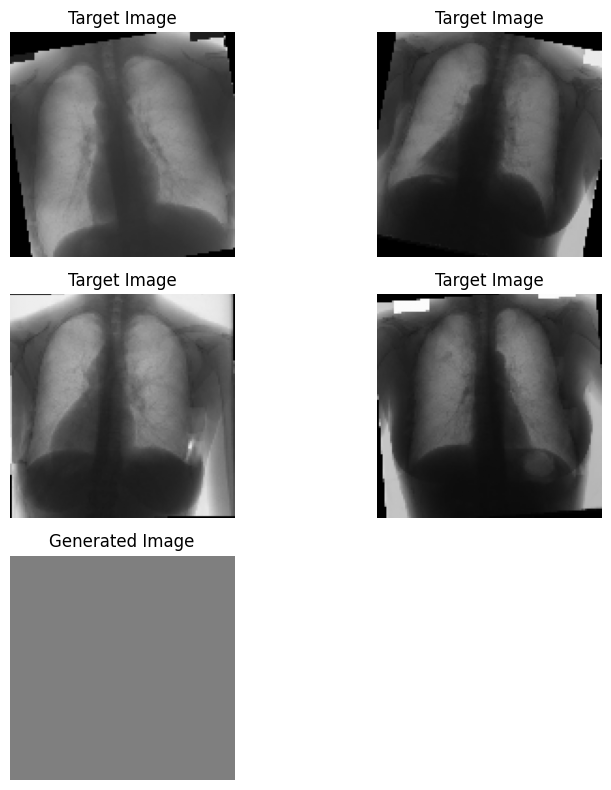

1/1 [==============================] - 0s 19ms/step
Epoch 2/50, Discriminator Loss: 0.7070665955543518, Generator Loss: 0.6207137107849121
1/1 [==============================] - 0s 19ms/step


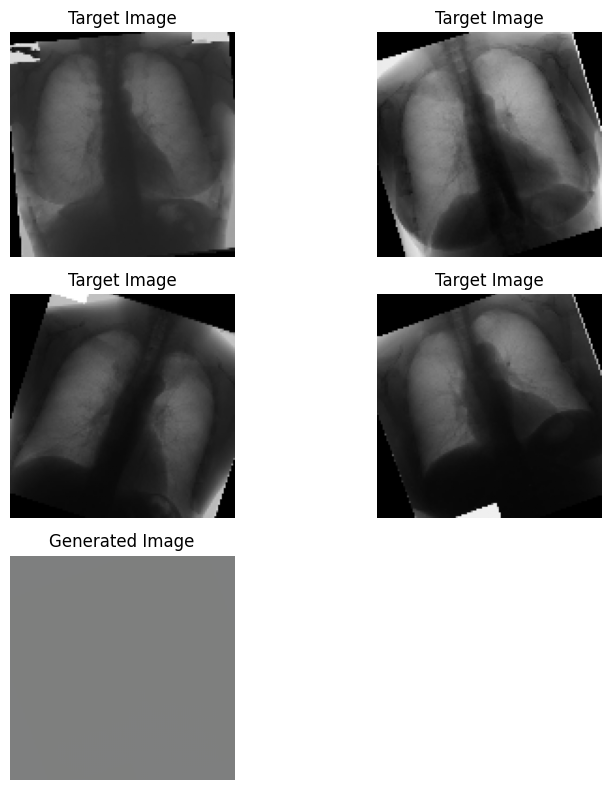

1/1 [==============================] - 0s 18ms/step
Epoch 3/50, Discriminator Loss: 0.7018965184688568, Generator Loss: 0.5939489603042603
1/1 [==============================] - 0s 19ms/step


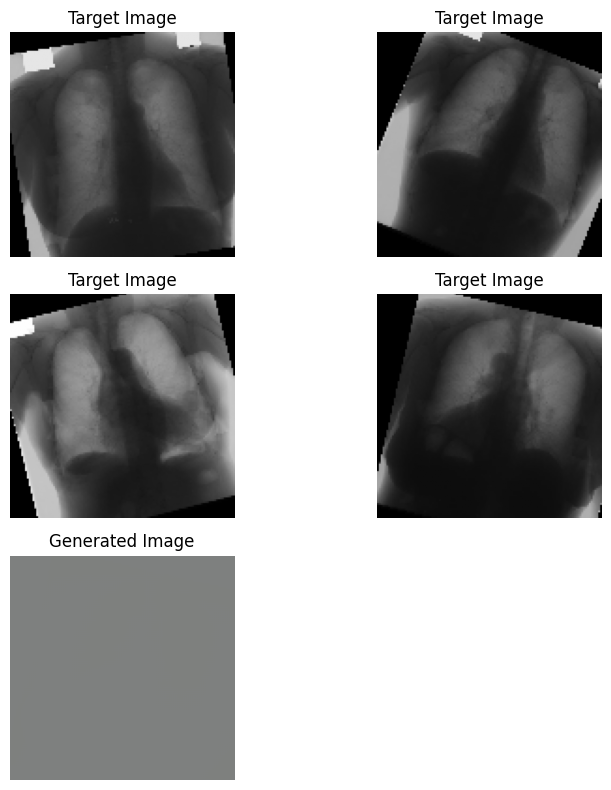

1/1 [==============================] - 0s 22ms/step
Epoch 4/50, Discriminator Loss: 0.6622686386108398, Generator Loss: 0.5951715707778931
1/1 [==============================] - 0s 23ms/step


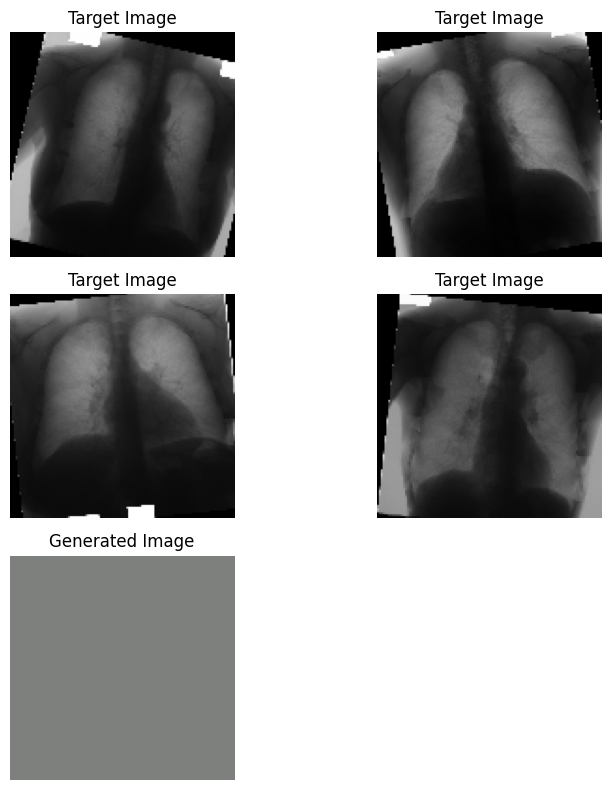

1/1 [==============================] - 0s 29ms/step
Epoch 5/50, Discriminator Loss: 0.600692629814148, Generator Loss: 0.5966764688491821
1/1 [==============================] - 0s 22ms/step


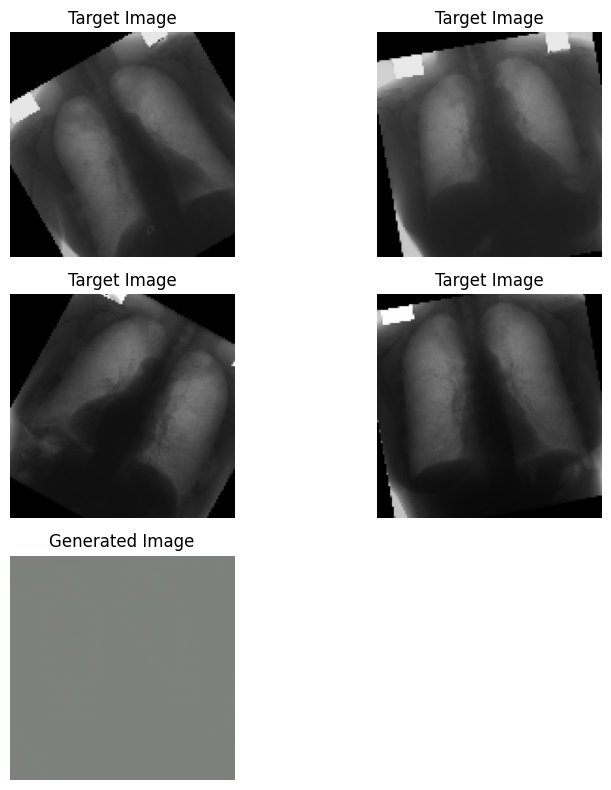

1/1 [==============================] - 0s 19ms/step
Epoch 6/50, Discriminator Loss: 0.5222593992948532, Generator Loss: 0.5918862819671631
1/1 [==============================] - 0s 19ms/step


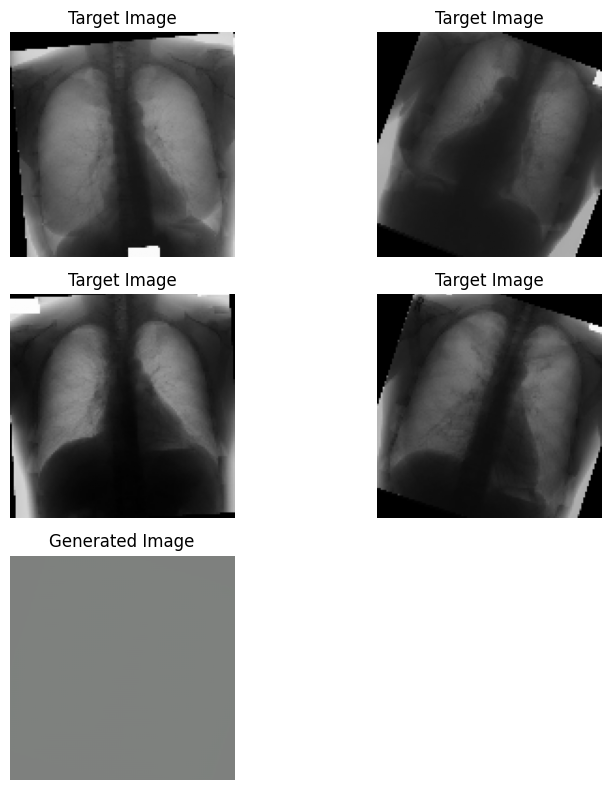

1/1 [==============================] - 0s 19ms/step
Epoch 7/50, Discriminator Loss: 0.4004131443798542, Generator Loss: 0.6213484406471252
1/1 [==============================] - 0s 19ms/step


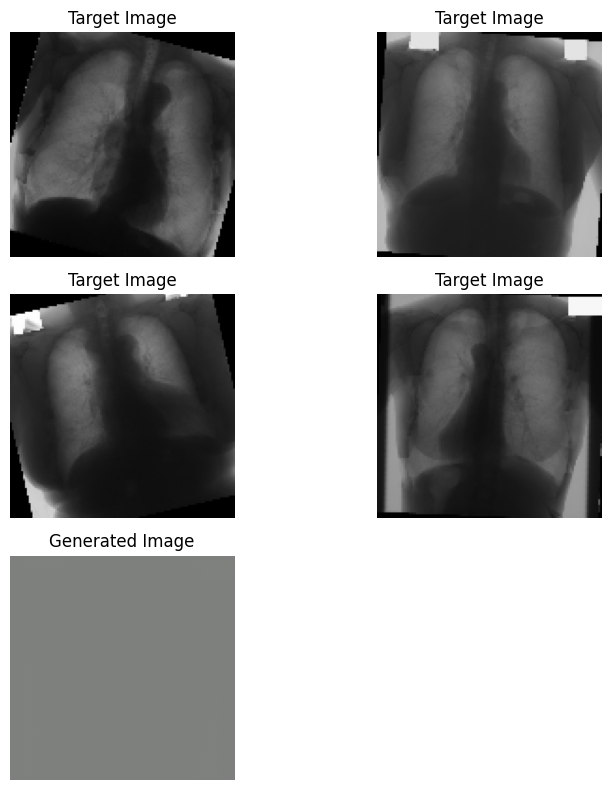

1/1 [==============================] - 0s 18ms/step
Epoch 8/50, Discriminator Loss: 0.31511567533016205, Generator Loss: 0.6756053566932678
1/1 [==============================] - 0s 19ms/step


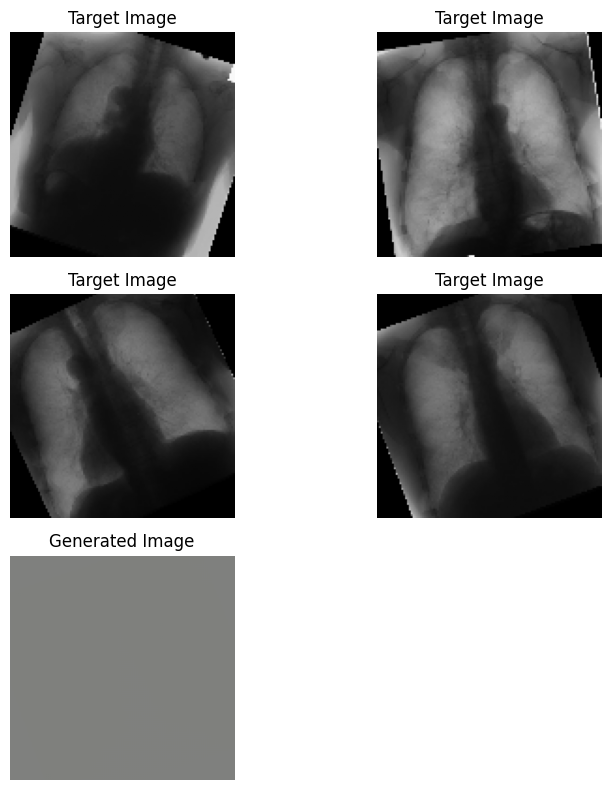

1/1 [==============================] - 0s 18ms/step
Epoch 9/50, Discriminator Loss: 0.2673090295866132, Generator Loss: 0.7317224740982056
1/1 [==============================] - 0s 19ms/step


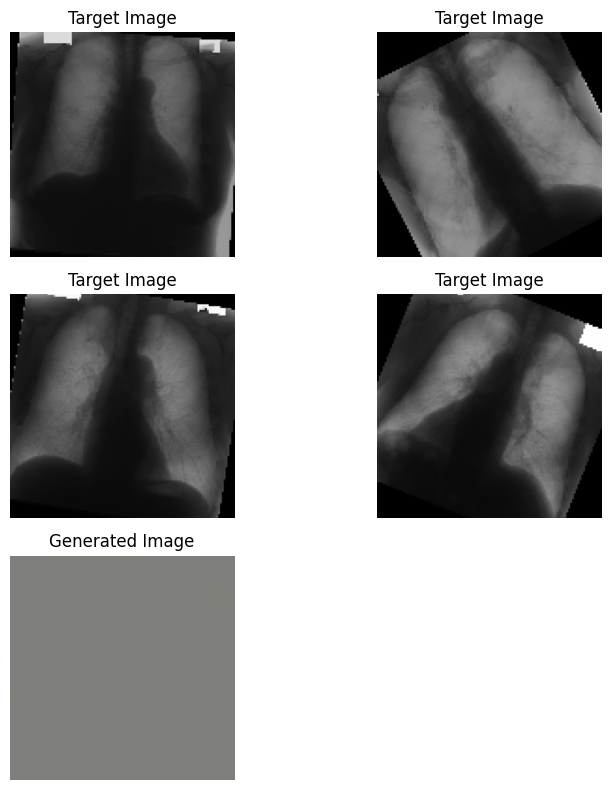

1/1 [==============================] - 0s 18ms/step
Epoch 10/50, Discriminator Loss: 0.22706554178148508, Generator Loss: 0.7468279600143433
1/1 [==============================] - 0s 26ms/step


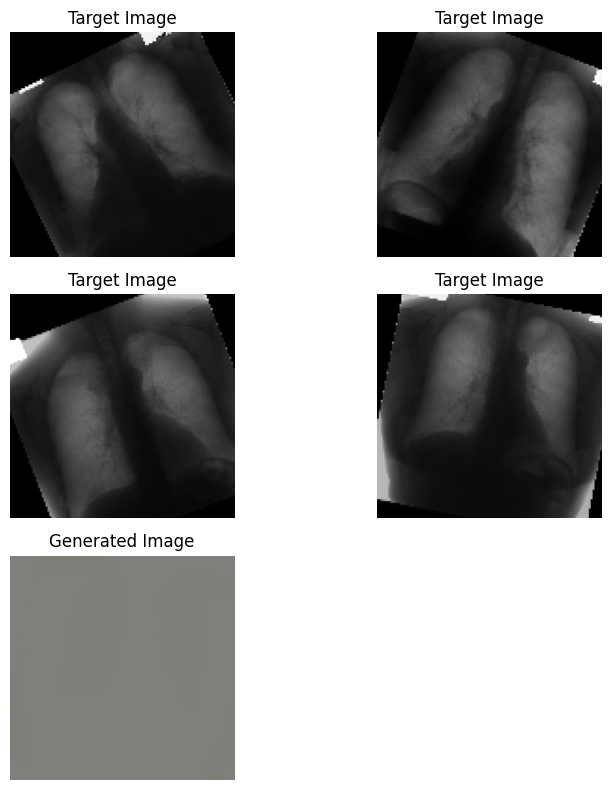

1/1 [==============================] - 0s 18ms/step
Epoch 11/50, Discriminator Loss: 0.2077396300737746, Generator Loss: 0.7313902378082275
1/1 [==============================] - 0s 19ms/step


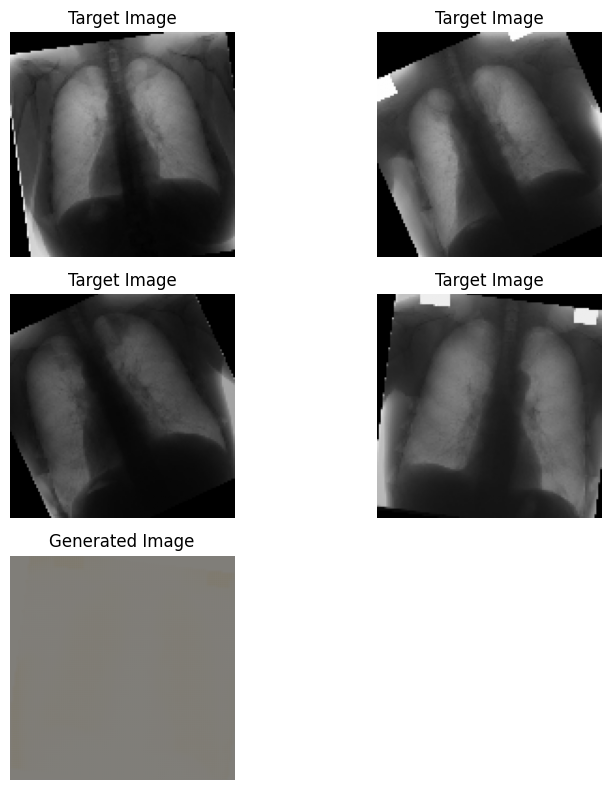

1/1 [==============================] - 0s 27ms/step
Epoch 12/50, Discriminator Loss: 0.21042400755686685, Generator Loss: 0.7016112804412842
1/1 [==============================] - 0s 18ms/step


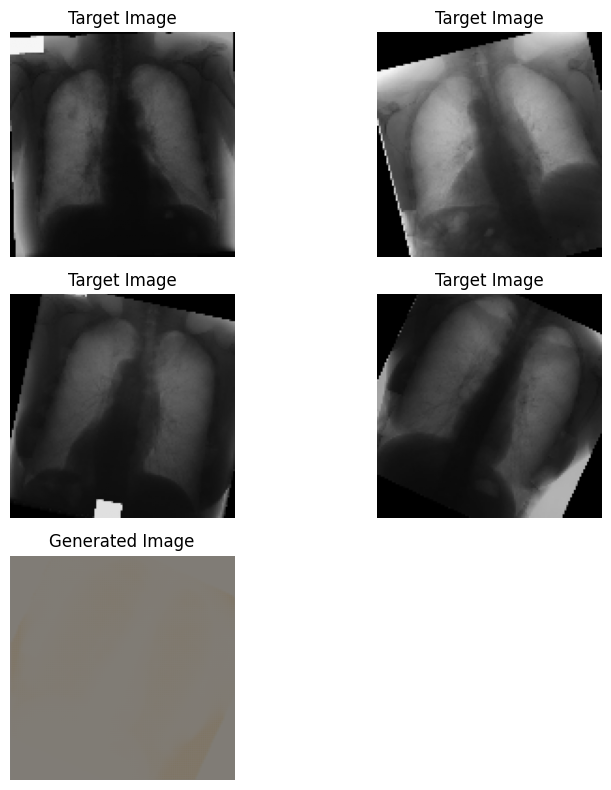

1/1 [==============================] - 0s 20ms/step
Epoch 13/50, Discriminator Loss: 0.20005339104682207, Generator Loss: 0.694248378276825
1/1 [==============================] - 0s 30ms/step


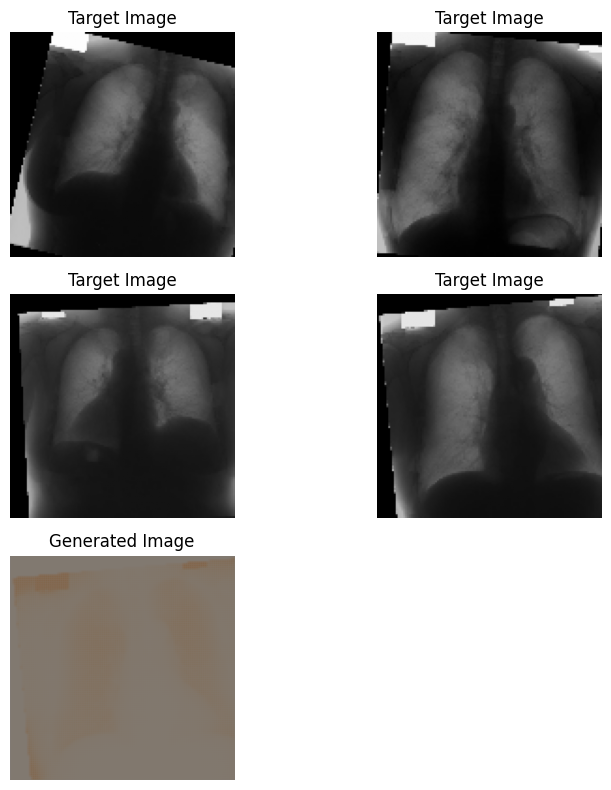

1/1 [==============================] - 0s 19ms/step
Epoch 14/50, Discriminator Loss: 0.23656064178794622, Generator Loss: 0.7739918231964111
1/1 [==============================] - 0s 19ms/step


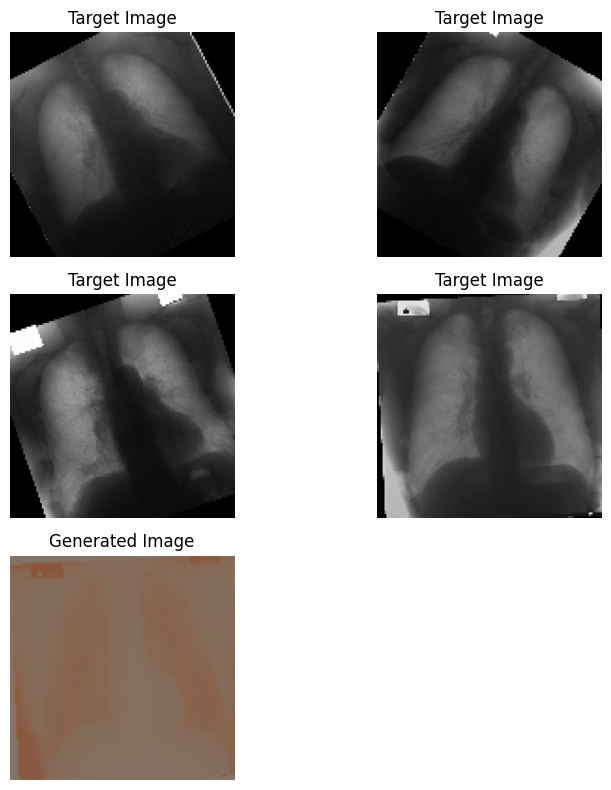

1/1 [==============================] - 0s 29ms/step
Epoch 15/50, Discriminator Loss: 0.328272040002048, Generator Loss: 0.7136679887771606
1/1 [==============================] - 0s 19ms/step


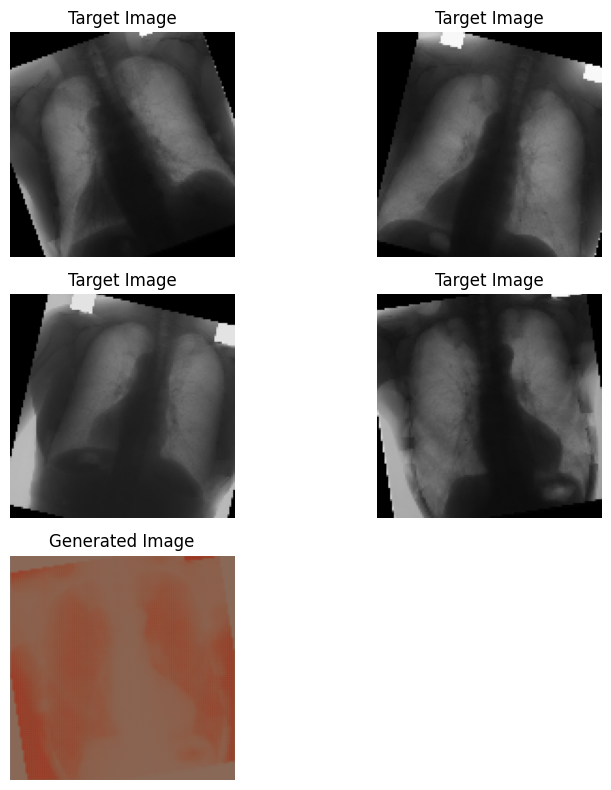

1/1 [==============================] - 0s 21ms/step
Epoch 16/50, Discriminator Loss: 0.12139145191758871, Generator Loss: 0.7251282930374146
1/1 [==============================] - 0s 18ms/step


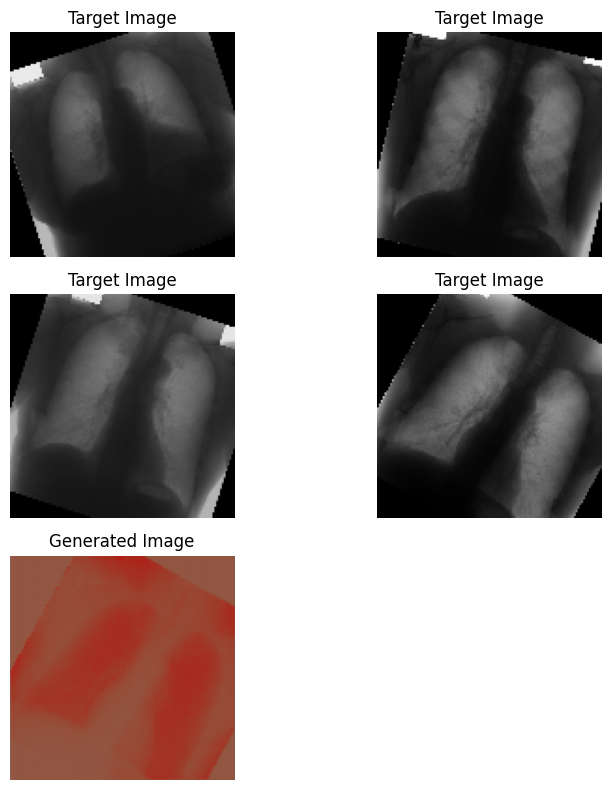

1/1 [==============================] - 0s 30ms/step
Epoch 17/50, Discriminator Loss: 0.050890953054476995, Generator Loss: 0.02222352847456932
1/1 [==============================] - 0s 24ms/step


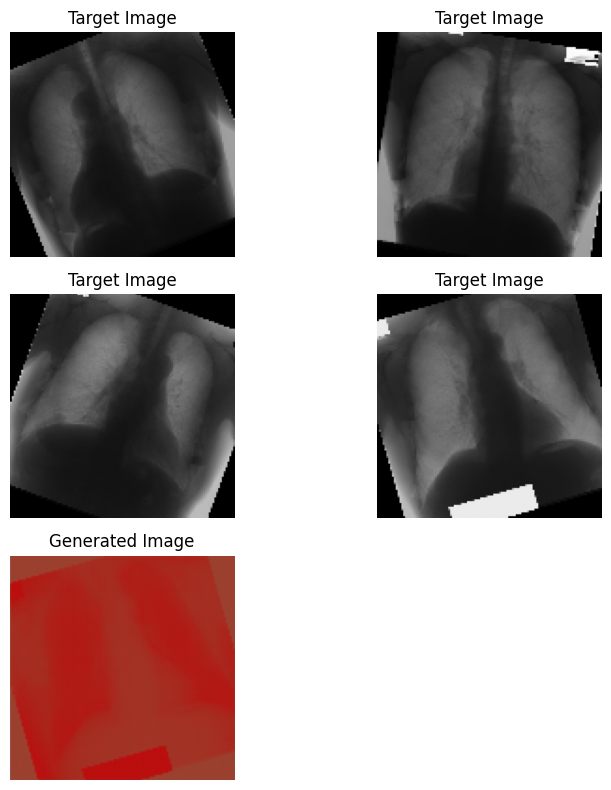

1/1 [==============================] - 0s 18ms/step
Epoch 18/50, Discriminator Loss: 0.020036712068986162, Generator Loss: 6.349905743263662e-05
1/1 [==============================] - 0s 29ms/step


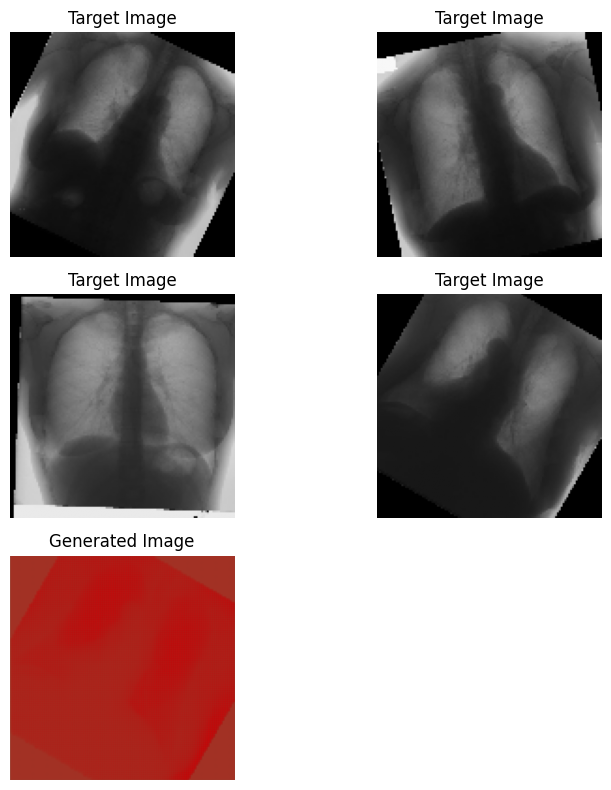

1/1 [==============================] - 0s 21ms/step
Epoch 19/50, Discriminator Loss: 0.013322624928297166, Generator Loss: 9.285293458560773e-07
1/1 [==============================] - 0s 22ms/step


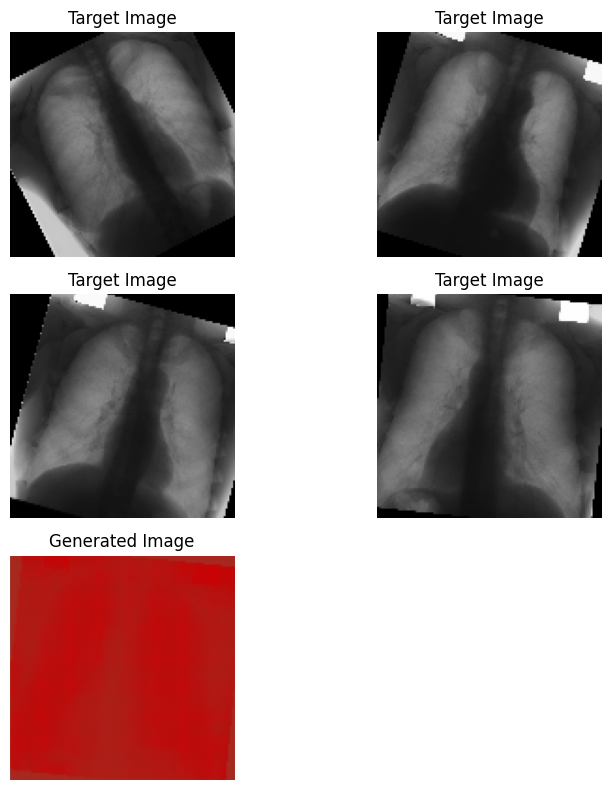

1/1 [==============================] - 0s 34ms/step
Epoch 20/50, Discriminator Loss: 0.007576269606293096, Generator Loss: 1.049379605433387e-07
1/1 [==============================] - 0s 35ms/step


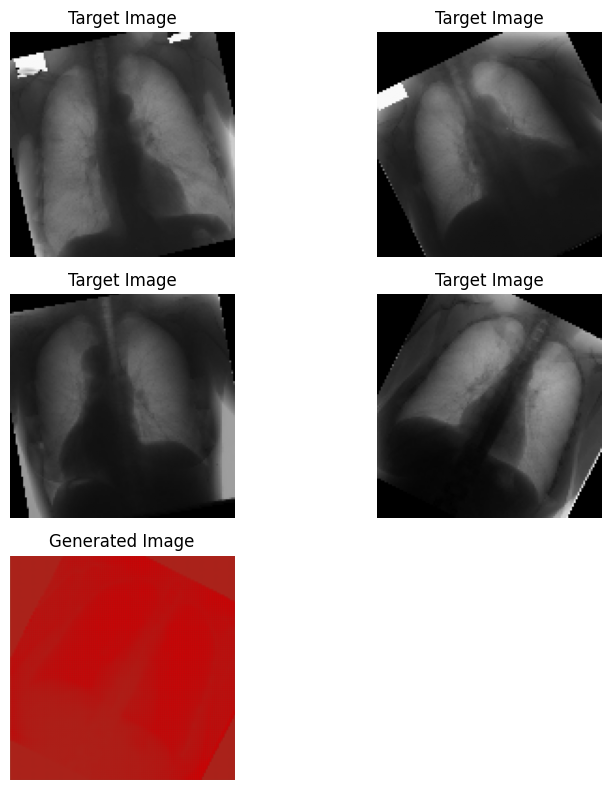

1/1 [==============================] - 0s 26ms/step
Epoch 21/50, Discriminator Loss: 0.0059842636835234775, Generator Loss: 1.7892382686568453e-08
1/1 [==============================] - 0s 33ms/step


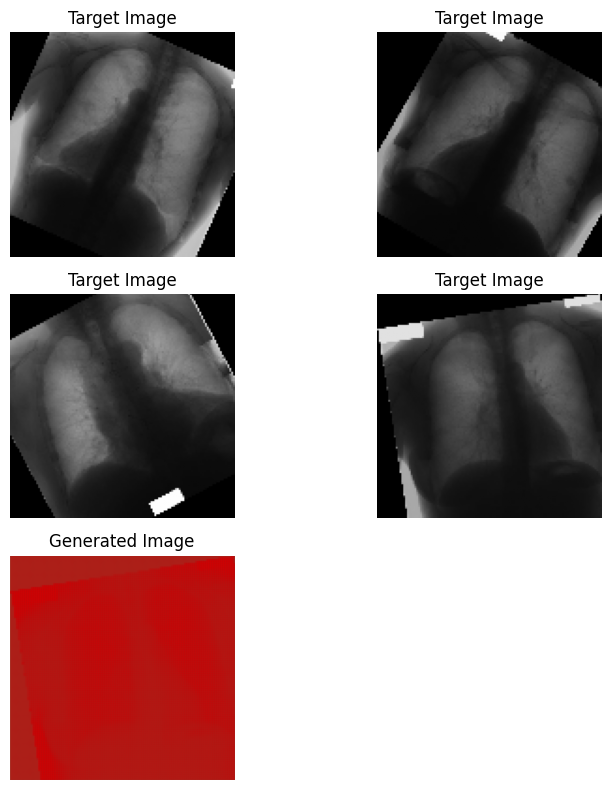

1/1 [==============================] - 0s 22ms/step
Epoch 22/50, Discriminator Loss: 0.004082391048717129, Generator Loss: 6.681737829694612e-09
1/1 [==============================] - 0s 20ms/step


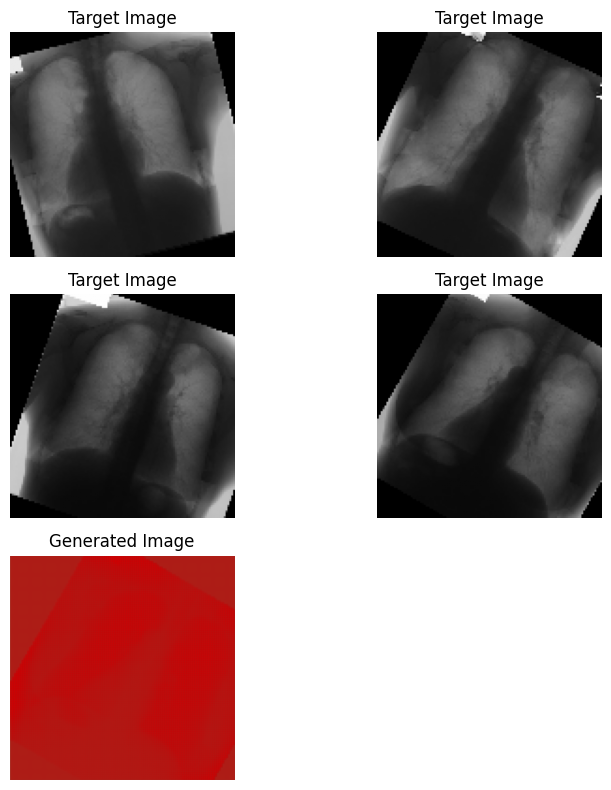

1/1 [==============================] - 0s 33ms/step
Epoch 23/50, Discriminator Loss: 0.0027577194893808107, Generator Loss: 3.6074434550670276e-09
1/1 [==============================] - 0s 20ms/step


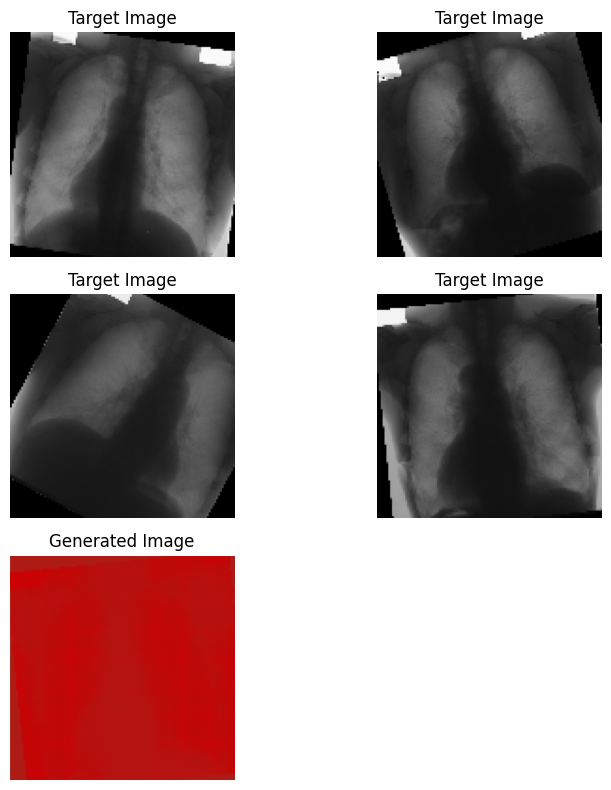

1/1 [==============================] - 0s 19ms/step
Epoch 24/50, Discriminator Loss: 0.002242495307271361, Generator Loss: 2.3734758602955708e-09
1/1 [==============================] - 0s 21ms/step


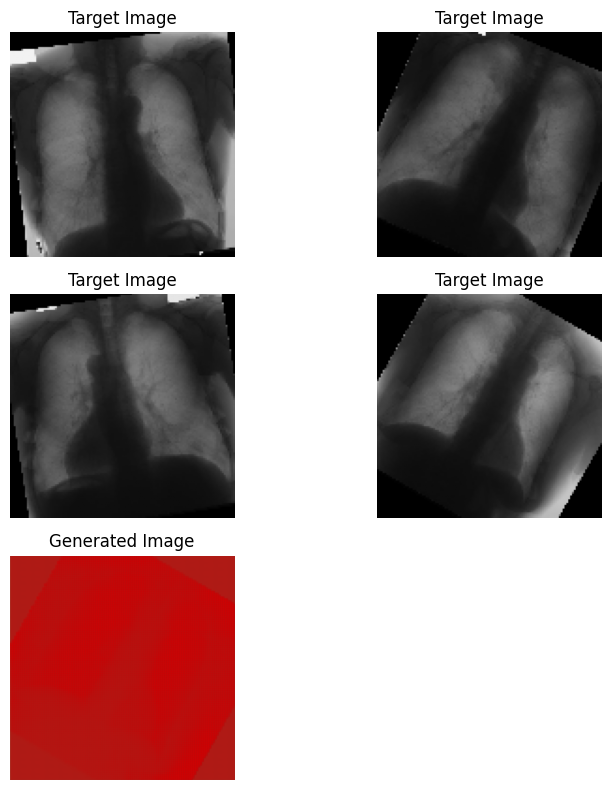

1/1 [==============================] - 0s 19ms/step
Epoch 25/50, Discriminator Loss: 0.0018699551011015863, Generator Loss: 1.976248942270331e-09
1/1 [==============================] - 0s 19ms/step


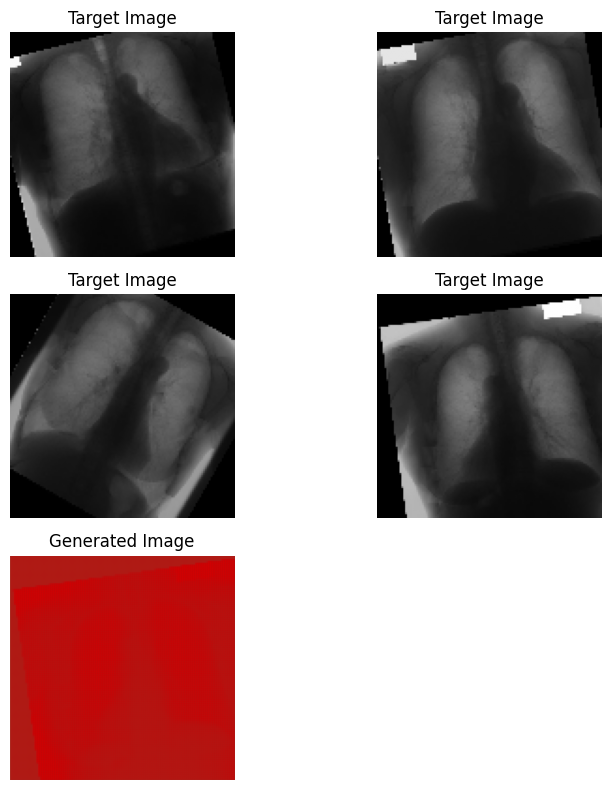

1/1 [==============================] - 0s 28ms/step
Epoch 26/50, Discriminator Loss: 0.0014779448978045865, Generator Loss: 2.1011656858860306e-09
1/1 [==============================] - 0s 22ms/step


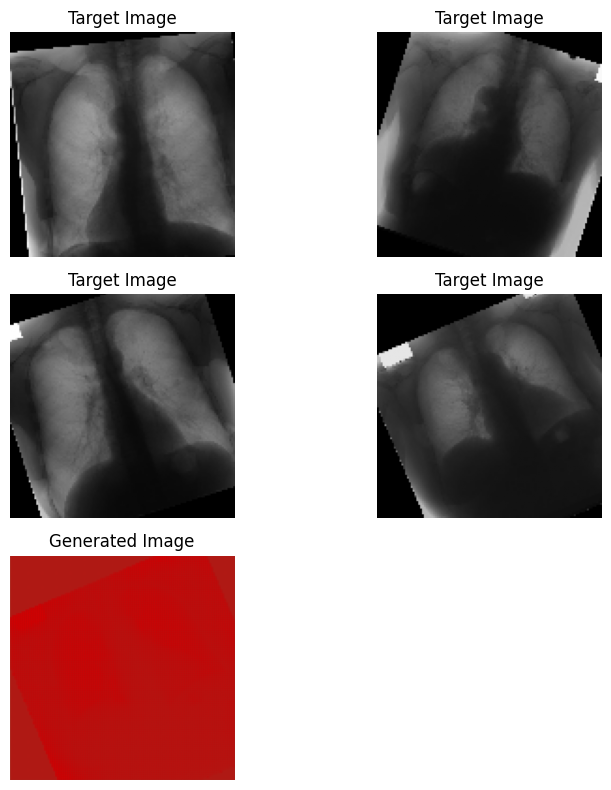

1/1 [==============================] - 0s 18ms/step
Epoch 27/50, Discriminator Loss: 0.0011911193173836186, Generator Loss: 2.4541151333323796e-09
1/1 [==============================] - 0s 18ms/step


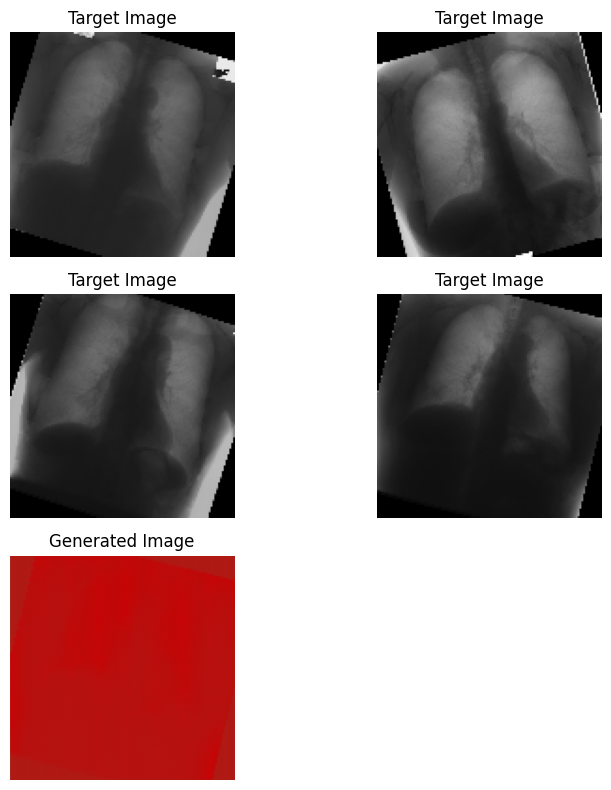

1/1 [==============================] - 0s 20ms/step
Epoch 28/50, Discriminator Loss: 0.0010972763414468405, Generator Loss: 2.397826825983884e-09
1/1 [==============================] - 0s 18ms/step


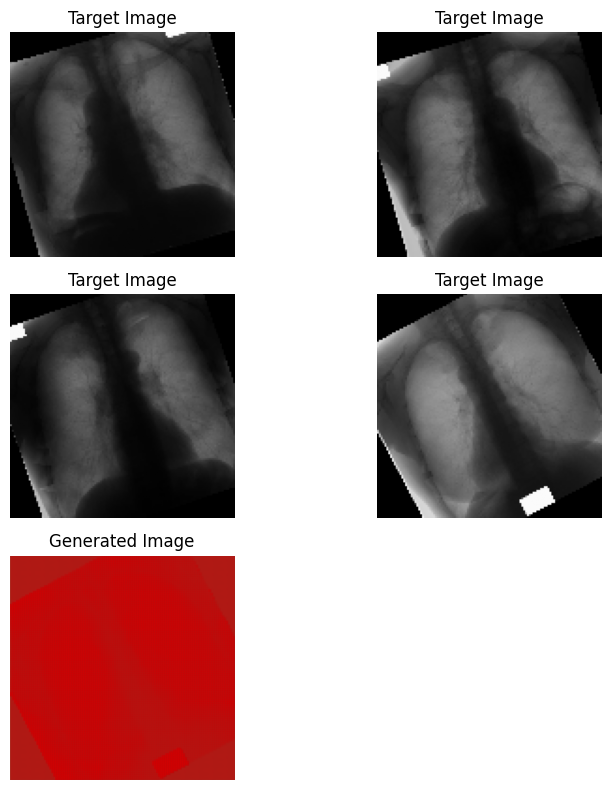

1/1 [==============================] - 0s 18ms/step
Epoch 29/50, Discriminator Loss: 0.0008935343948422012, Generator Loss: 3.088336253398438e-09
1/1 [==============================] - 0s 31ms/step


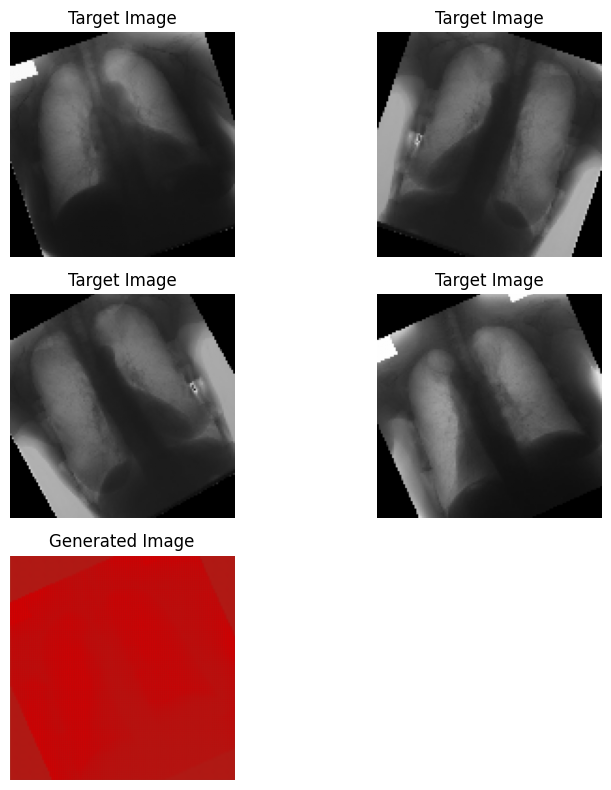

1/1 [==============================] - 0s 18ms/step
Epoch 30/50, Discriminator Loss: 0.0008213634152875194, Generator Loss: 3.3254350384481768e-09
1/1 [==============================] - 0s 19ms/step


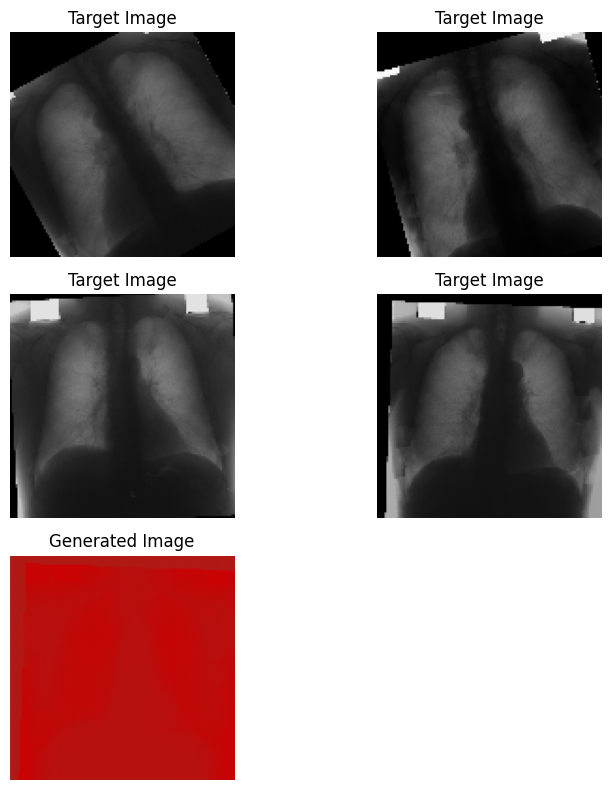

1/1 [==============================] - 0s 21ms/step
Epoch 31/50, Discriminator Loss: 0.0007140238891906164, Generator Loss: 4.2480818862600245e-09
1/1 [==============================] - 0s 22ms/step


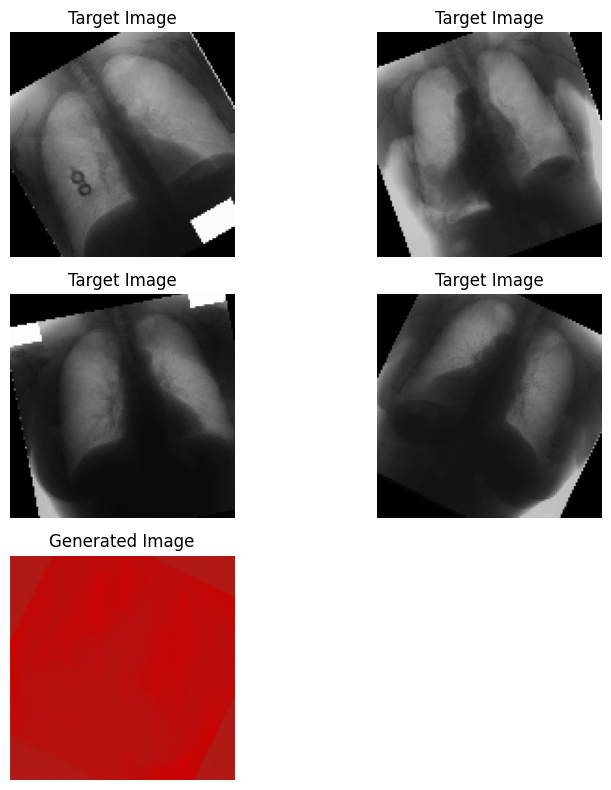

1/1 [==============================] - 0s 33ms/step
Epoch 32/50, Discriminator Loss: 0.0006653812618687481, Generator Loss: 4.333414072021924e-09
1/1 [==============================] - 0s 32ms/step


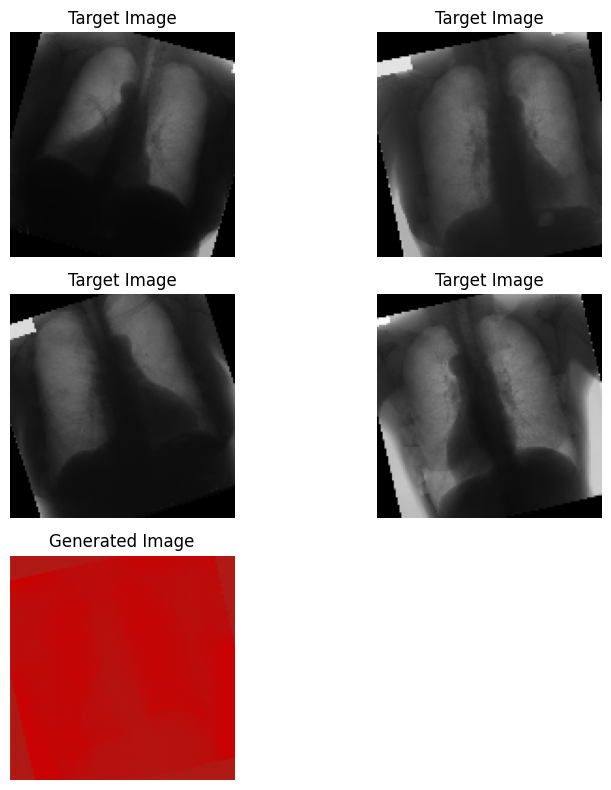

1/1 [==============================] - 0s 18ms/step
Epoch 33/50, Discriminator Loss: 0.0005625194172437228, Generator Loss: 6.30505692100769e-09
1/1 [==============================] - 0s 18ms/step


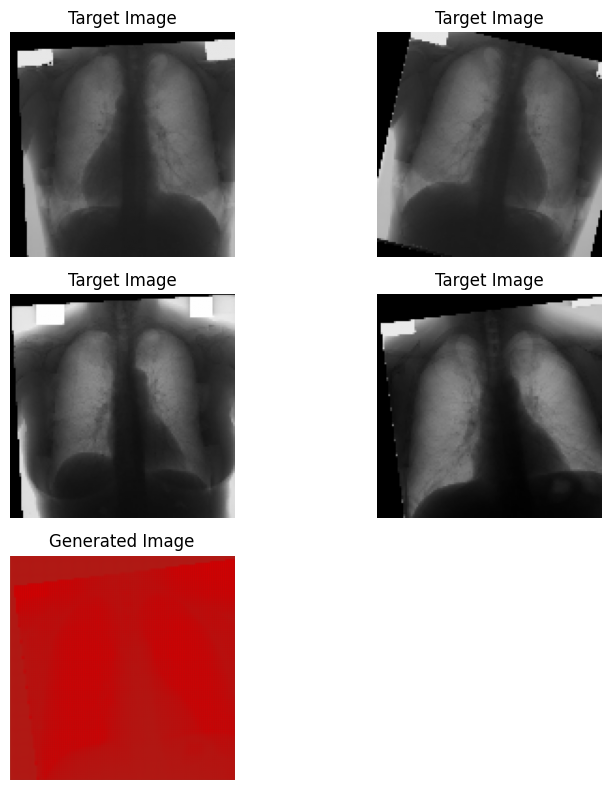

1/1 [==============================] - 0s 24ms/step
Epoch 34/50, Discriminator Loss: 0.0005154191821387577, Generator Loss: 7.117511025001022e-09
1/1 [==============================] - 0s 18ms/step


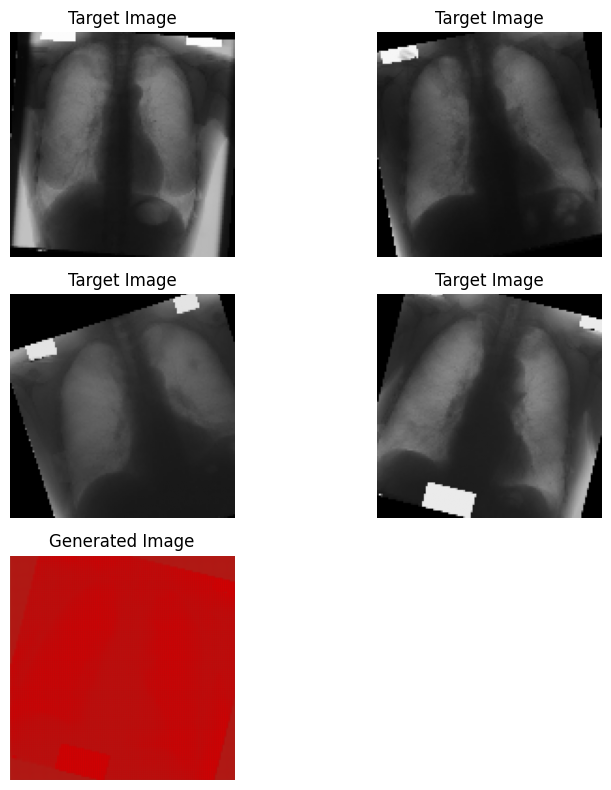

1/1 [==============================] - 0s 18ms/step
Epoch 35/50, Discriminator Loss: 0.0004767677171762506, Generator Loss: 7.589560091503245e-09
1/1 [==============================] - 0s 26ms/step


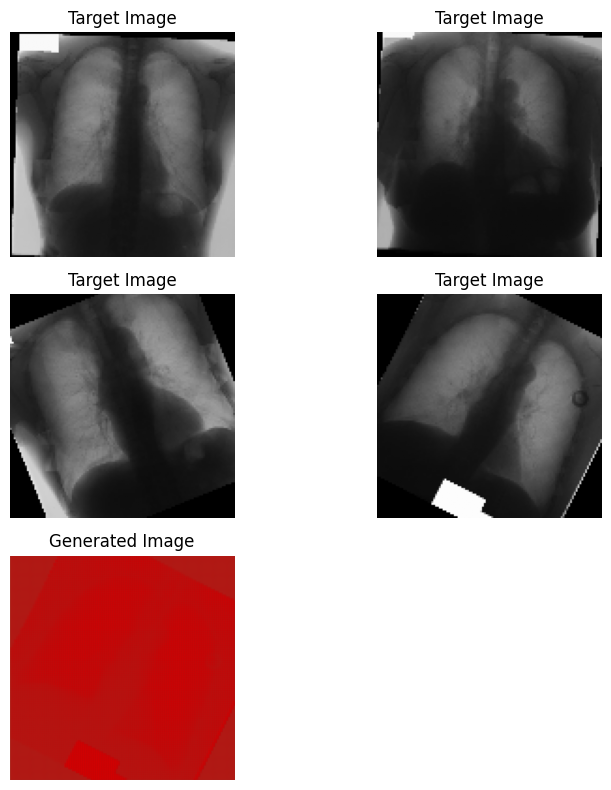

1/1 [==============================] - 0s 19ms/step
Epoch 36/50, Discriminator Loss: 0.0004361940966447006, Generator Loss: 8.955949759581472e-09
1/1 [==============================] - 0s 18ms/step


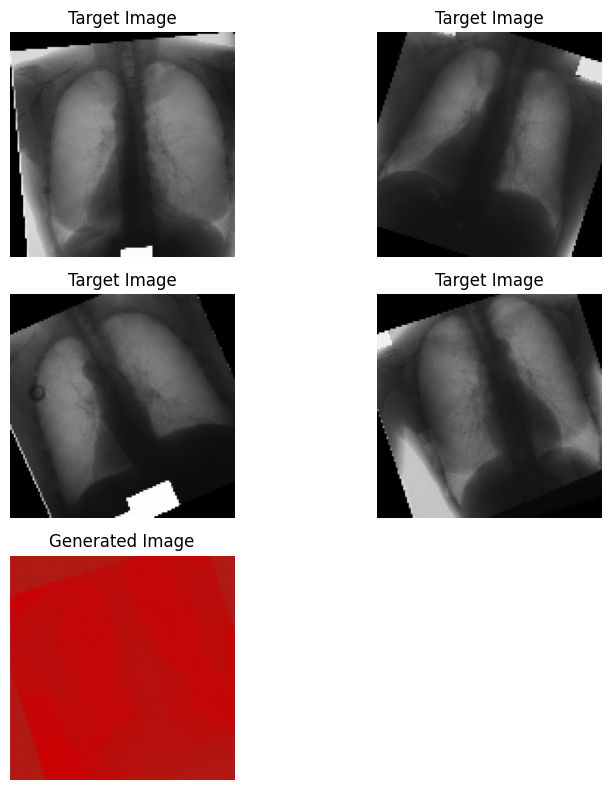

1/1 [==============================] - 0s 19ms/step
Epoch 37/50, Discriminator Loss: 0.0003899188615894896, Generator Loss: 1.0920207849096641e-08
1/1 [==============================] - 0s 20ms/step


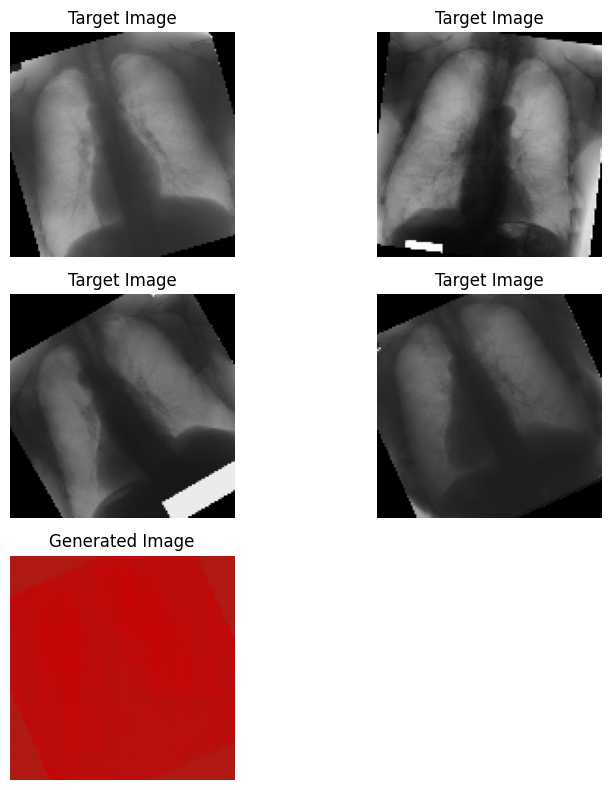

1/1 [==============================] - 0s 18ms/step
Epoch 38/50, Discriminator Loss: 0.0004083783430574202, Generator Loss: 9.212979712458491e-09
1/1 [==============================] - 0s 18ms/step


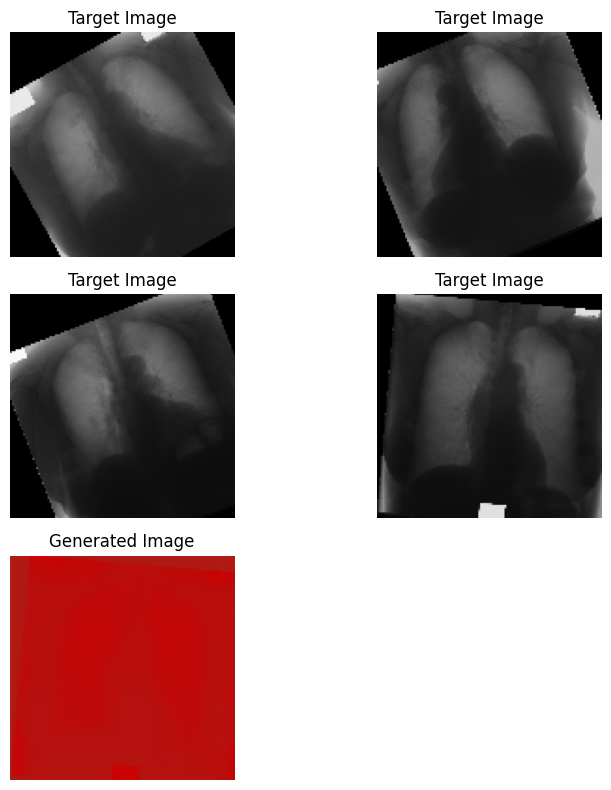

1/1 [==============================] - 0s 19ms/step
Epoch 39/50, Discriminator Loss: 0.00037907238696601136, Generator Loss: 9.981929949276491e-09
1/1 [==============================] - 0s 19ms/step


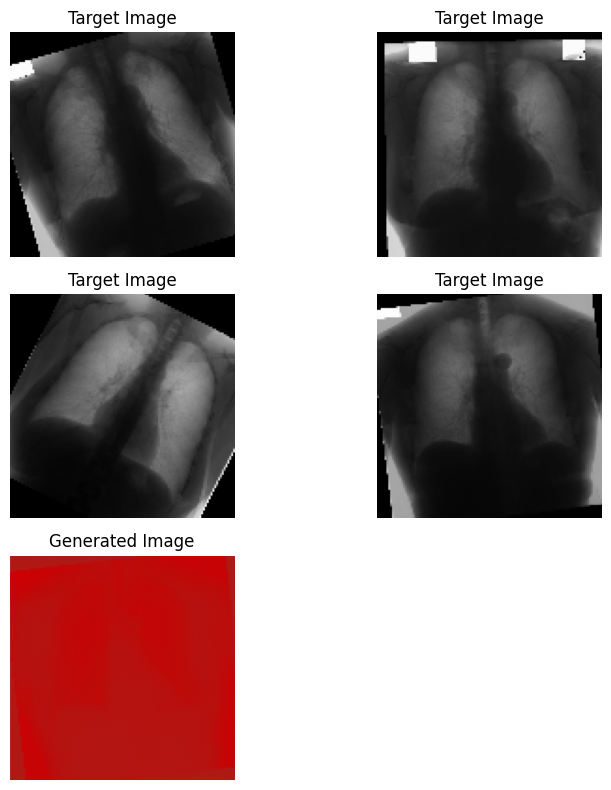

1/1 [==============================] - 0s 30ms/step
Epoch 40/50, Discriminator Loss: 0.00034528377421182014, Generator Loss: 1.1757050444316519e-08
1/1 [==============================] - 0s 20ms/step


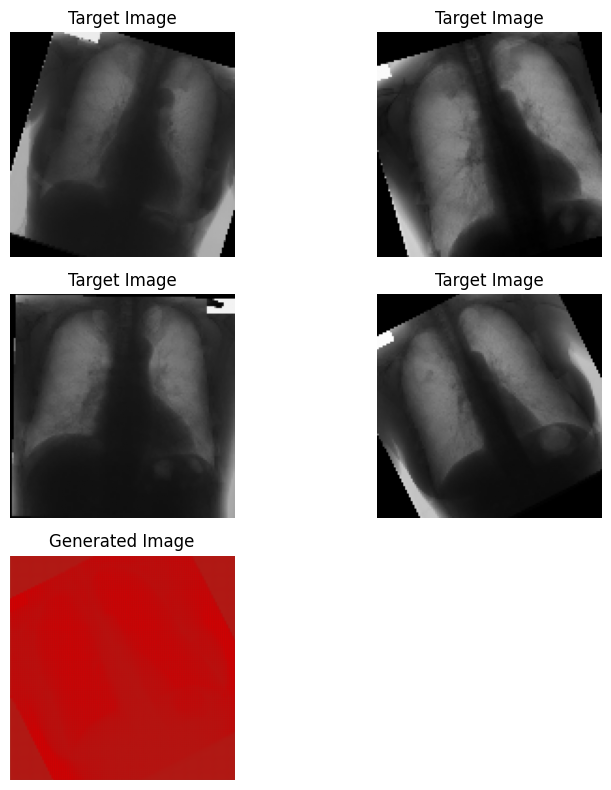

1/1 [==============================] - 0s 19ms/step
Epoch 41/50, Discriminator Loss: 0.00032518877422119726, Generator Loss: 1.2523354797622233e-08
1/1 [==============================] - 0s 18ms/step


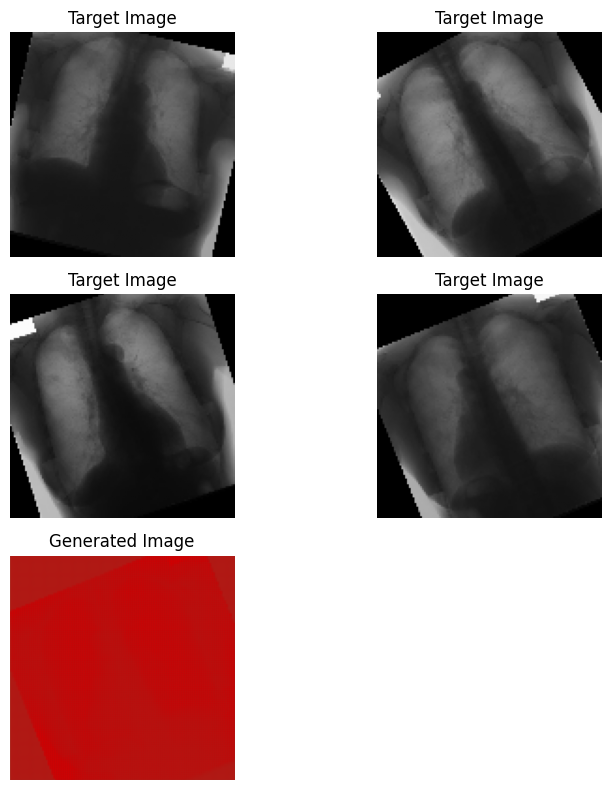

1/1 [==============================] - 0s 19ms/step
Epoch 42/50, Discriminator Loss: 0.000301058171468757, Generator Loss: 1.2649486791360687e-08
1/1 [==============================] - 0s 19ms/step


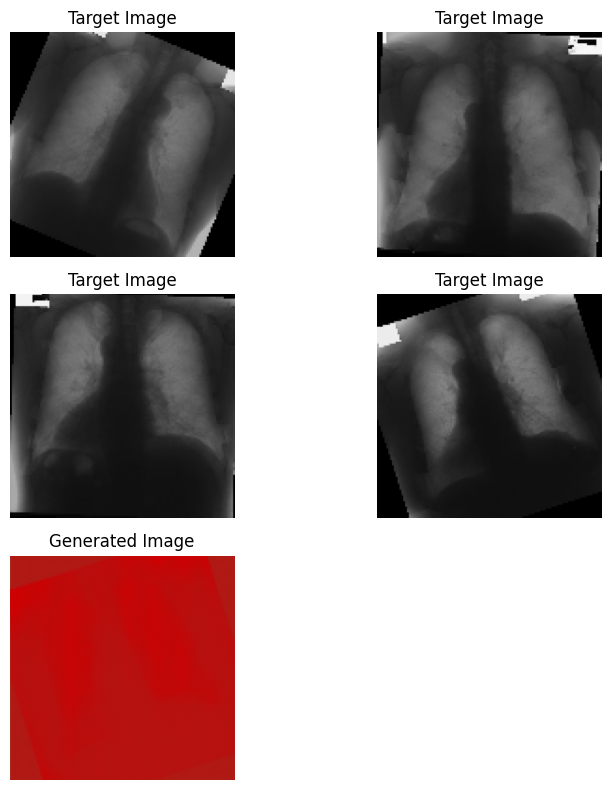

1/1 [==============================] - 0s 29ms/step
Epoch 43/50, Discriminator Loss: 0.00028994933167277677, Generator Loss: 1.4713507745511833e-08
1/1 [==============================] - 0s 30ms/step


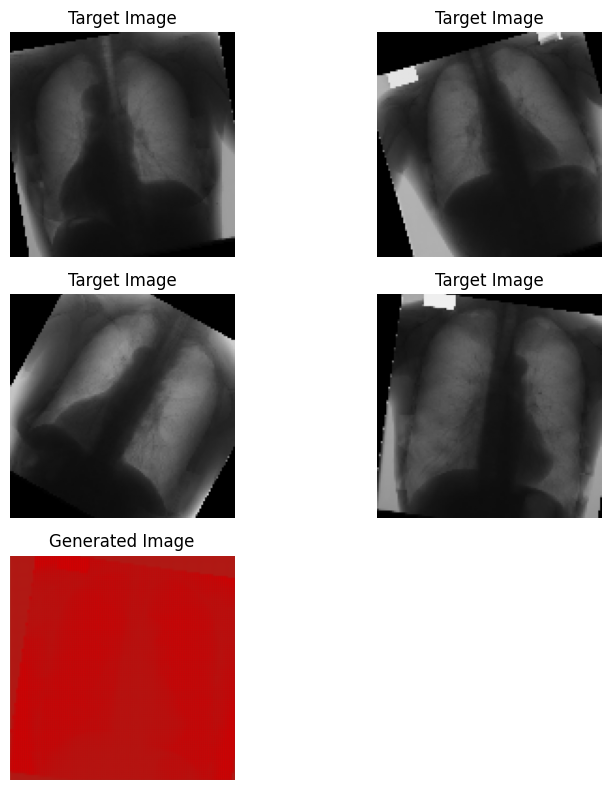

1/1 [==============================] - 0s 18ms/step
Epoch 44/50, Discriminator Loss: 0.0002700038024765754, Generator Loss: 1.5828952371066407e-08
1/1 [==============================] - 0s 18ms/step


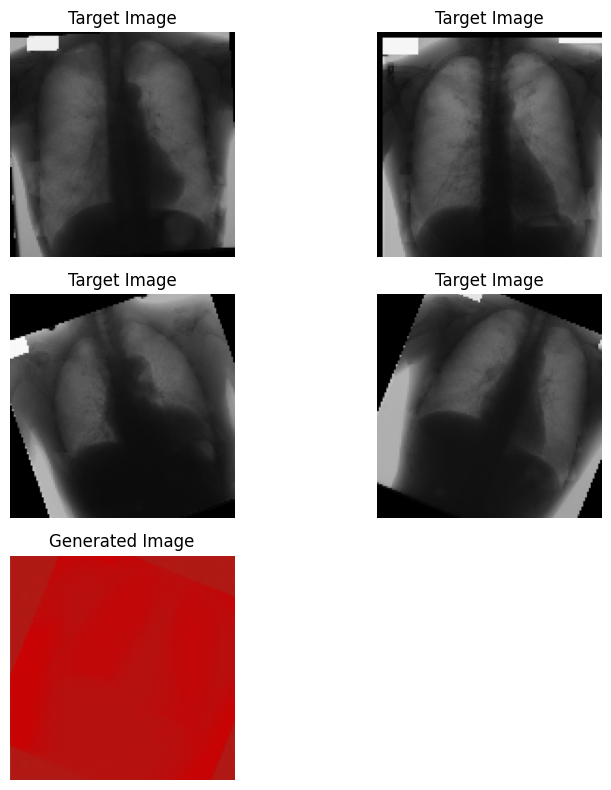

1/1 [==============================] - 0s 19ms/step
Epoch 45/50, Discriminator Loss: 0.00025924152897247336, Generator Loss: 1.6798958668573505e-08
1/1 [==============================] - 0s 21ms/step


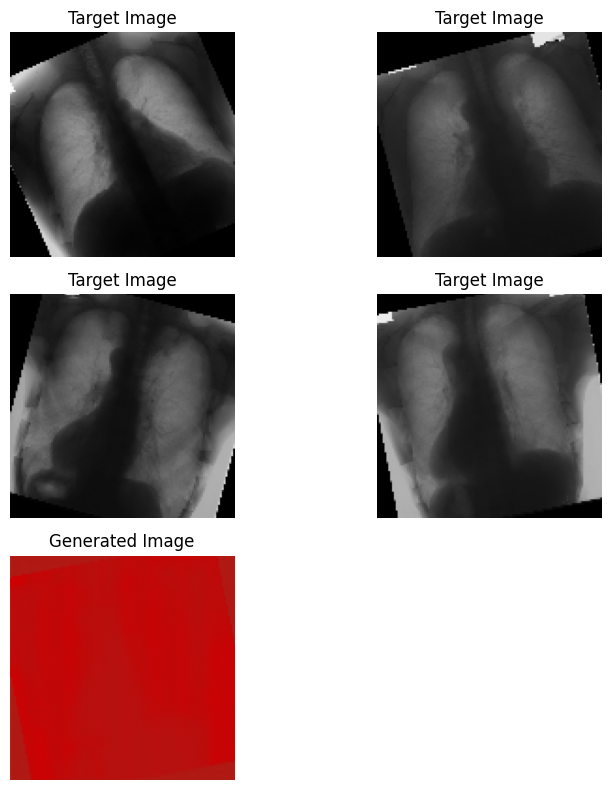

1/1 [==============================] - 0s 29ms/step
Epoch 46/50, Discriminator Loss: 0.00023972601306857422, Generator Loss: 1.949145556068288e-08
1/1 [==============================] - 0s 29ms/step


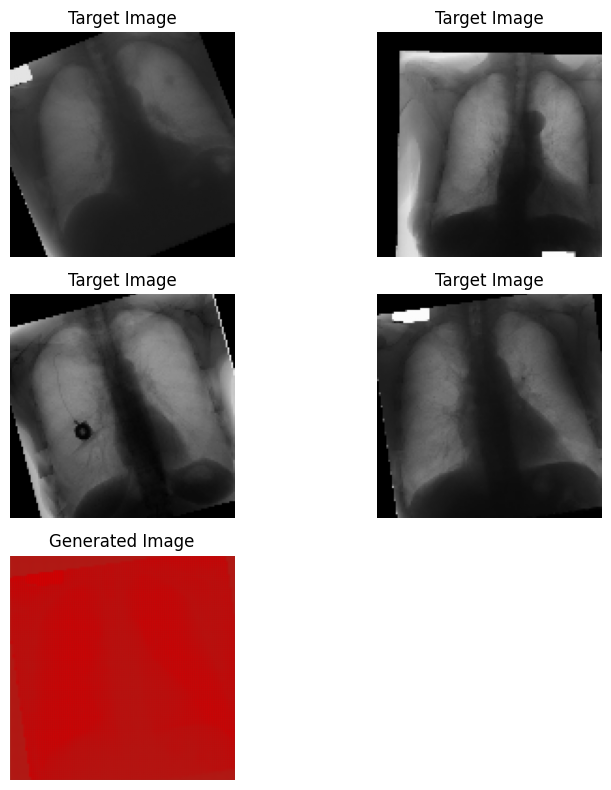

1/1 [==============================] - 0s 20ms/step
Epoch 47/50, Discriminator Loss: 0.00023807081797606275, Generator Loss: 1.7347016267876825e-08
1/1 [==============================] - 0s 18ms/step


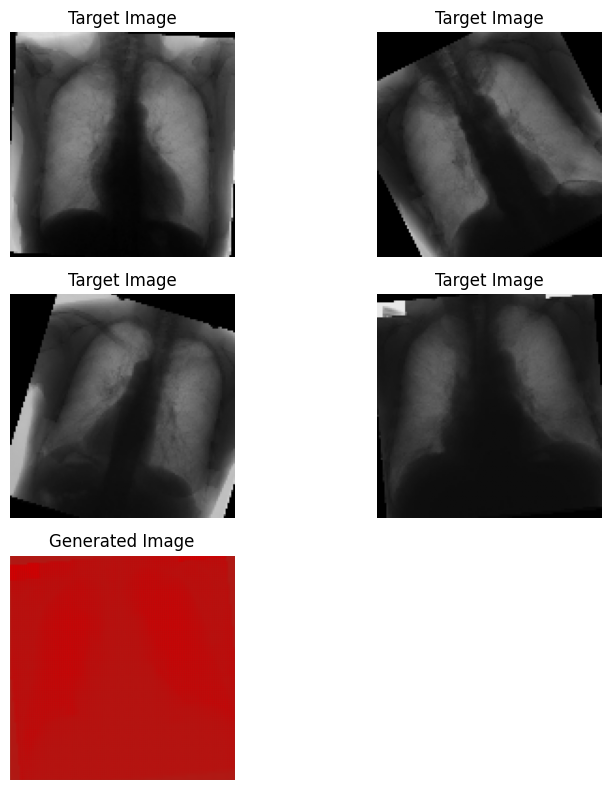

1/1 [==============================] - 0s 18ms/step
Epoch 48/50, Discriminator Loss: 0.0002155325639417659, Generator Loss: 2.2309261993314067e-08
1/1 [==============================] - 0s 18ms/step


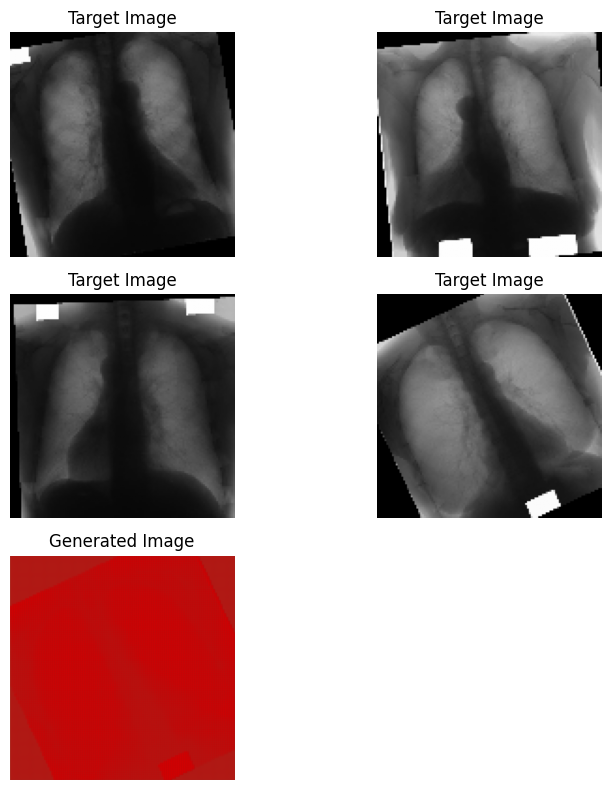

1/1 [==============================] - 0s 32ms/step
Epoch 49/50, Discriminator Loss: 0.0002092211660797429, Generator Loss: 2.464507353749923e-08
1/1 [==============================] - 0s 29ms/step


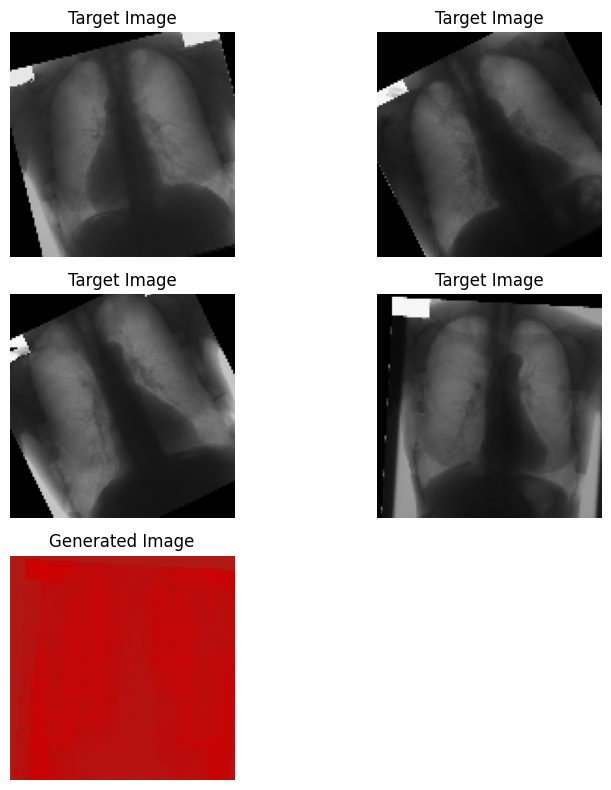

1/1 [==============================] - 0s 20ms/step
Epoch 50/50, Discriminator Loss: 0.00020205349179095887, Generator Loss: 2.3004620430810974e-08
1/1 [==============================] - 0s 20ms/step


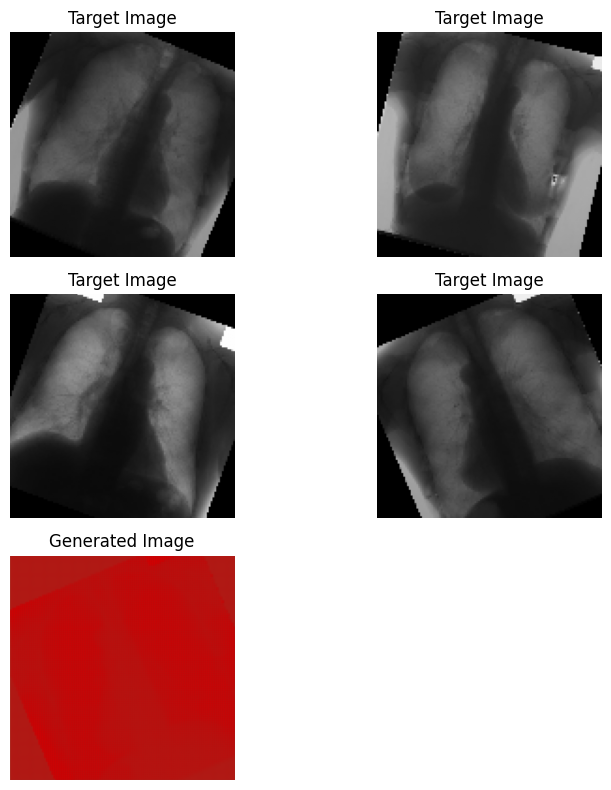

In [ ]:
# Set hyperparameters
epochs = 50
batch_size = 4

# Reshape the target_images to match the generator output shape
target_images_reshaped = target_images.reshape(-1, SIZE, SIZE, 3)

# Train the GAN
train_gan(gan, generator, discriminator, source_images, target_images_reshaped, epochs, batch_size)

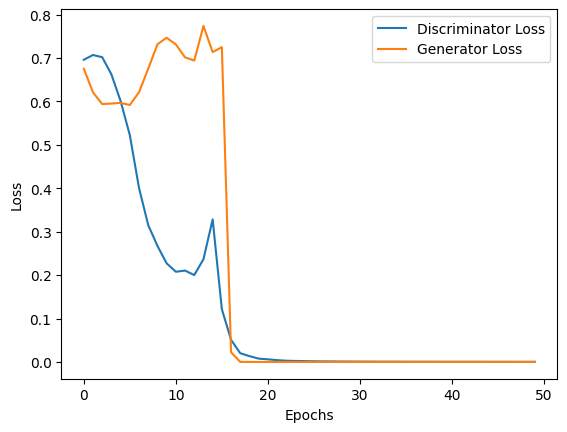

In [ ]:
# Plot the losses
plt.plot(range(epochs), discriminator_losses, label='Discriminator Loss')
plt.plot(range(epochs), generator_losses, label='Generator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Save the generator model architecture to a JSON file
generator_json = generator.to_json()
with open('generator_model.json', 'w') as json_file:
    json_file.write(generator_json)

# Save the generator model weights to an HDF5 file
generator.save_weights('generator_weights.h5')

In [ ]:
# Load the saved generator model and its weights
from keras.models import model_from_json

# Load the generator model architecture from the JSON file
with open('generator_model.json', 'r') as json_file:
    generator_json = json_file.read()
generator = model_from_json(generator_json)

# Load the generator model weights from the HDF5 file
generator.load_weights('generator_weights.h5')

1/1 [==============================] - 0s 232ms/step


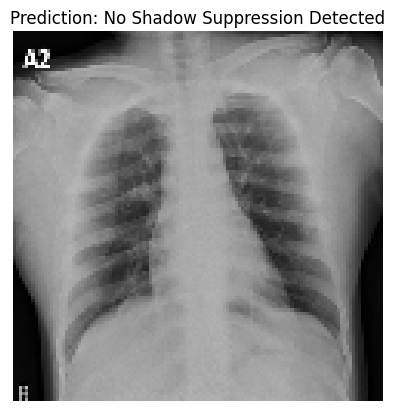

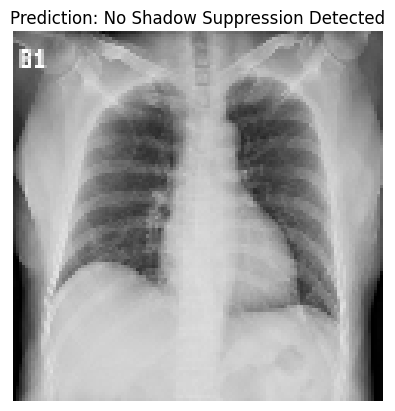

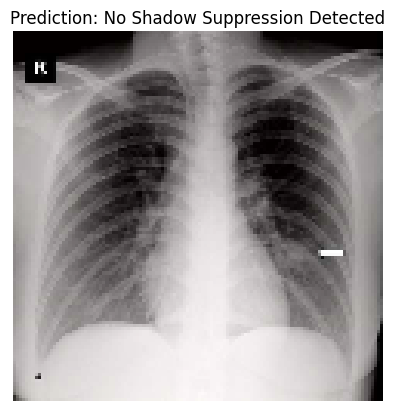

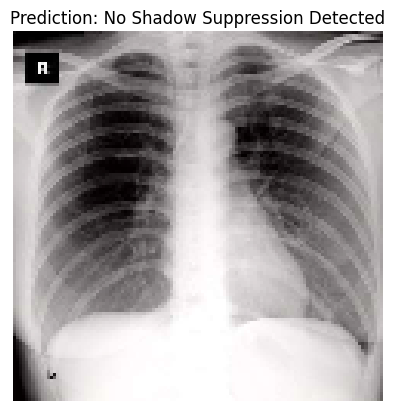

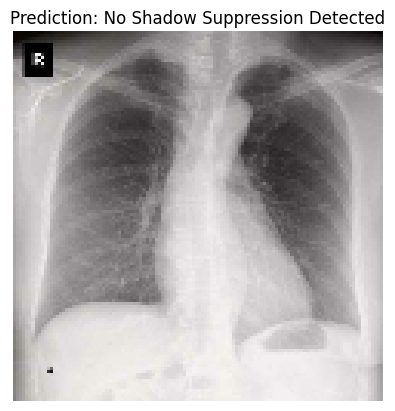

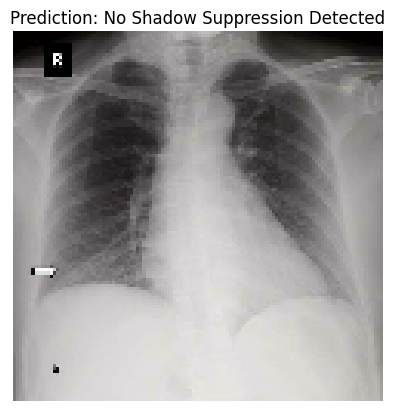

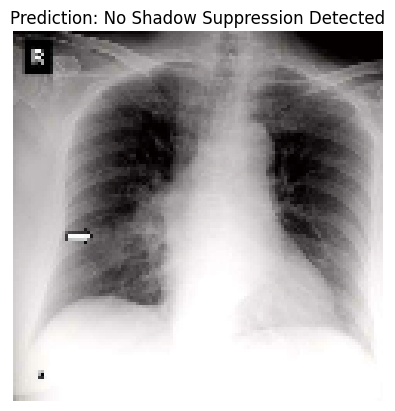

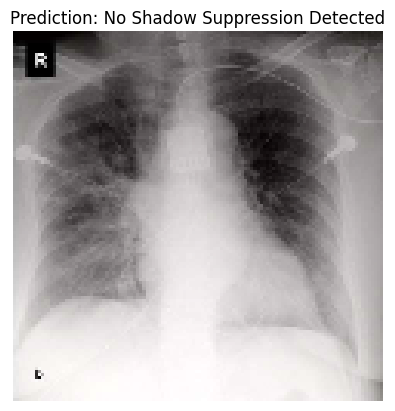

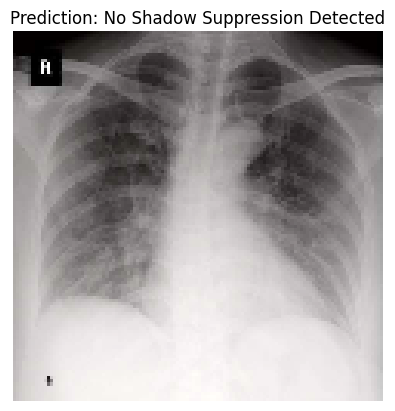

In [ ]:
# 2. Preprocess the test images from your local directory
test_image_directory = '/content/drive/MyDrive/Datasets/bone_shadow_suppression_dataset/Dataset/test/'
test_image_names = sorted(glob(test_image_directory + "*.png"))

test_images = []
for image_name in test_image_names:
    img_path = os.path.join(test_image_directory, image_name)
    img = preprocess_image(img_path)
    test_images.append(img)

# Convert the list of test images to a numpy array
test_images = np.array(test_images)

# 3. Generate output images using the generator
generated_images = generator.predict(test_images)
generated_images_resized = tf.image.resize(generated_images, (120, 120))

# 4. Pass the resized generated output images through the discriminator for prediction
discriminator_predictions = discriminator.predict(generated_images_resized)

# 5. Interpret the discriminator's predictions to determine the class
class_predictions = []
for prediction in discriminator_predictions:
    # Assuming the decision threshold is 0.5
    if prediction >= 0.5:
        class_predictions.append('No Shadow Suppression Detected')
    else:
        class_predictions.append('Shadow Suppression Detected')

# 6.Print the predictions with test images
for i in range(len(test_image_names)):
 #print(f"Image: {test_image_names[i]}, Prediction: {class_predictions[i]}")

    # Show the test image alongside the prediction
    plt.imshow(test_images[i])
    plt.title(f"Prediction: {class_predictions[i]}")
    plt.axis('off')
    plt.show()